In [1]:
import pandas as pd 
import numpy as np
import re

##LDA stuff
import gensim
from gensim.utils import simple_preprocess
import nltk
from nltk.corpus import words
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

##cleaning stuff
from sklearn.metrics.pairwise import cosine_similarity
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer

import gensim.corpora as corpora
import pyLDAvis
import pyLDAvis.gensim
from gensim.models import CoherenceModel

##plotting
from matplotlib import pyplot as plt
from matplotlib import colors as mcolors
import seaborn as sns

In [2]:
def preprocess_text(text):
    tokens = word_tokenize(text)
    tokens = [word for word in tokens if word.isalnum()]
    tokens = [word.lower() for word in tokens]
    tokens = [lemmatizer.lemmatize(word) for word in tokens]
    return tokens

In [3]:
def preprocess(text):
    tokens = word_tokenize(text)
    tokens = [word for word in tokens if word.isalnum()]
    tokens = [word.lower() for word in tokens]
    return tokens

In [4]:
def remove_non_english_words(text, valid_words):
    tokens = word_tokenize(text)
    ans = [w for w in tokens if w.lower() in valid_words]
    return ' '.join(ans)

def remove_stopwords(text):
    tokens = word_tokenize(text)
    ans = [w for w in tokens if w.lower() not in stop_words]
    return ' '.join(ans)

In [5]:
df_fullerton = pd.read_csv('../../../data/processed/cleaned_fullerton.csv')
df_parkroyal = pd.read_csv('../../../data/processed/cleaned_parkroyal-collection-marina-bay.csv')
df_pan = pd.read_csv('../../../data/processed/cleaned_pan-pacific.csv')
df_mbs = pd.read_csv('../../../data/processed/cleaned_mbs_total.csv')
df_swissotel = pd.read_csv('../../../data/processed/cleaned_swissotel-the-stamford.csv')


df_combi = pd.concat([df_fullerton, df_parkroyal, df_pan, df_mbs, df_swissotel])

In [6]:
##filter for year >= 2015
df_filtered = df_combi[df_combi['year'] >= 2015]

##preprocess text
nltk.download('stopwords')
nltk.download('words')
# Get the list of valid English words
english_words = set(words.words())
# set stopwords
sw = stopwords.words('english')
sw.extend(['fullerton', 'parkroyal', 'collection', 'marina', 'marina_bay', 'pacific', 'pan', 'pan_pacific', 'mbs', 'bay_sands', 
          'swissotel', 'stamford', 'star'])
stop_words = set(sw)
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package stopwords to C:\Users\Chen
[nltk_data]     Wei\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package words to C:\Users\Chen
[nltk_data]     Wei\AppData\Roaming\nltk_data...
[nltk_data]   Package words is already up-to-date!


## Stemmed

In [7]:
df_filtered['stem_review'] = df_filtered['stem_review'].apply(remove_stopwords)
df_filtered['stem_review'] = df_filtered['stem_review'].apply(remove_non_english_words, valid_words=english_words)
df_filtered['stem_tokens'] = df_filtered['stem_review'].apply(preprocess)

In [8]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(df_filtered['stem_tokens'])
pre_corpus = [pre_dict.doc2bow(text) for text in df_filtered['stem_tokens']]

In [ ]:
## find best_coherence:
for i in range(2, 7):
    lda = gensim.models.ldamodel.LdaModel
    pre_ldamodel = lda(pre_corpus, num_topics=i, id2word=pre_dict, passes=15)
    
    precovid_coherence = CoherenceModel(model=pre_ldamodel, texts=df_filtered['tokens'], dictionary=pre_dict, coherence='c_v')
    lda_coherence = precovid_coherence.get_coherence()
    print(f"The coherence score at topic {i} is {lda_coherence}")

In [9]:
## Use 5 topics as baseline
lda = gensim.models.ldamodel.LdaModel
ldamodel = lda(pre_corpus, num_topics=6, id2word=pre_dict, passes=15)

In [10]:
# For Pre-COVID
topics_pre_stem = ldamodel.show_topics(formatted=False, num_words=20)
data_flat_pre = [word for word_list in df_filtered['stem_tokens'] for word in word_list]

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_7492\1556627539.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')


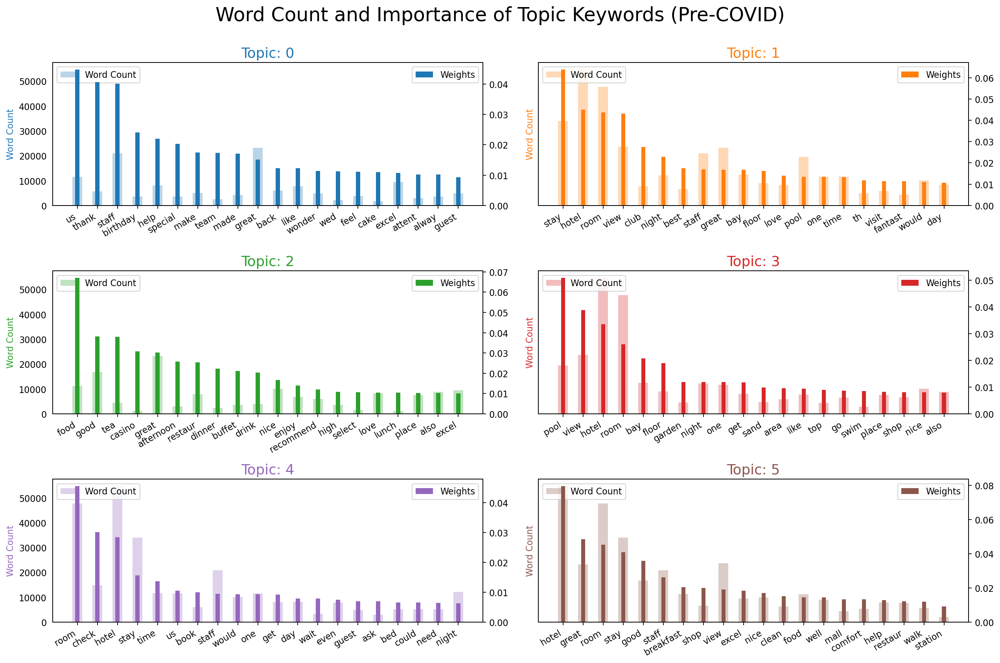

In [11]:
# Create a function to generate the plot
def plot_word_count_importance(topics, data_flat, title):
    out = []
    for i, topic in topics:
        for word, weight in topic:
            out.append([word, i, weight, data_flat.count(word)])

    df_plot = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])

    # Plot Word Count and Weights of Topic Keywords
    fig, axes = plt.subplots(3, 2, figsize=(16, 10), sharey=True, dpi=160)
    cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    for i, ax in enumerate(axes.flatten()):
        ax.bar(x='word', height='word_count', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
        ax_twin = ax.twinx()
        ax_twin.bar(x='word', height='importance', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.2, label='Weights')
        ax.set_ylabel('Word Count', color=cols[i])
        ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
        ax.tick_params(axis='y', left=False)
        ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')
        ax.legend(loc='upper left')
        ax_twin.legend(loc='upper right')

    fig.tight_layout(w_pad=2)
    fig.suptitle(title, fontsize=22, y=1.05)
    plt.show()

# For Pre-COVID
plot_word_count_importance(topics_pre_stem, data_flat_pre, 'Word Count and Importance of Topic Keywords (Pre-COVID)')

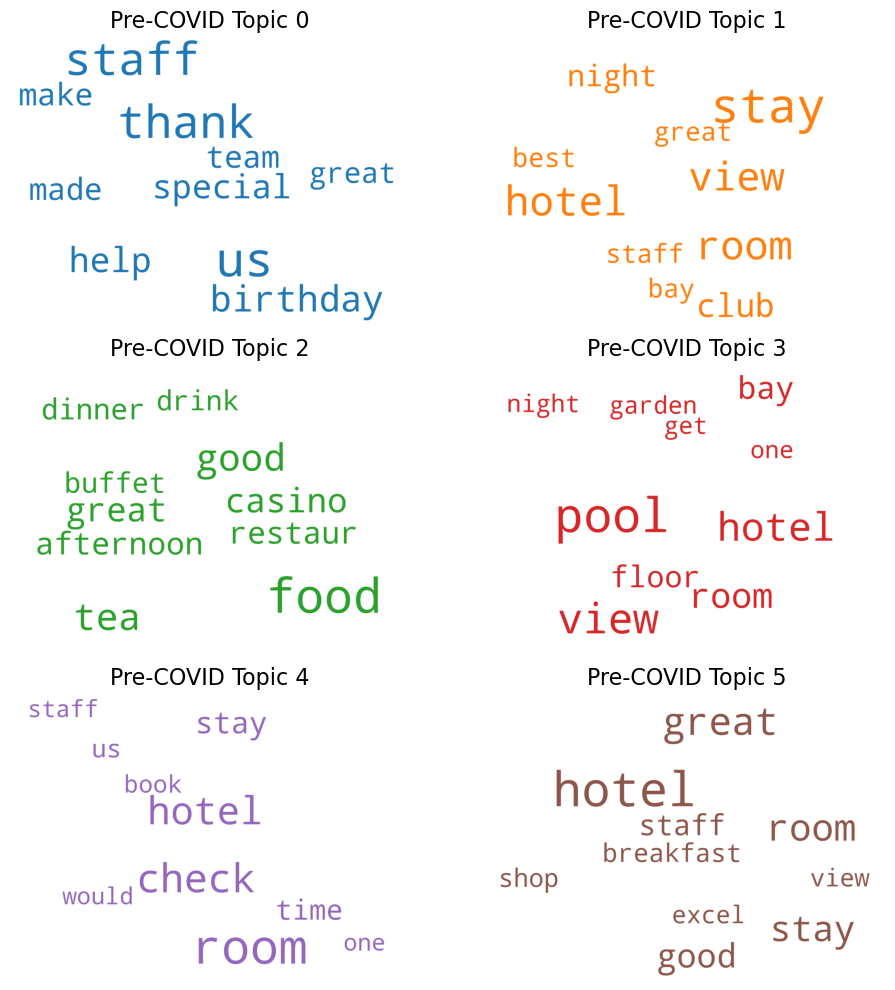

In [12]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(6):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [13]:
vis = pyLDAvis.gensim.prepare(topic_model=ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

## Bigrams

In [16]:
clean_data = df_filtered['stem_review'].apply(preprocess)
clean_data = clean_data.apply(lambda x: ' '.join(x))

In [17]:
from nltk import ngrams
bigrams_data = []

for d in clean_data:
    tokens = word_tokenize(d)
    bigrams_data.append(["_".join(w) for w in ngrams(tokens, 2)])


In [18]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(bigrams_data)
pre_corpus = [pre_dict.doc2bow(text) for text in bigrams_data]

lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=6, id2word=pre_dict, passes=15)

In [19]:
# For Pre-COVID
topics_pre_stembi = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in bigrams_data for word in word_list]

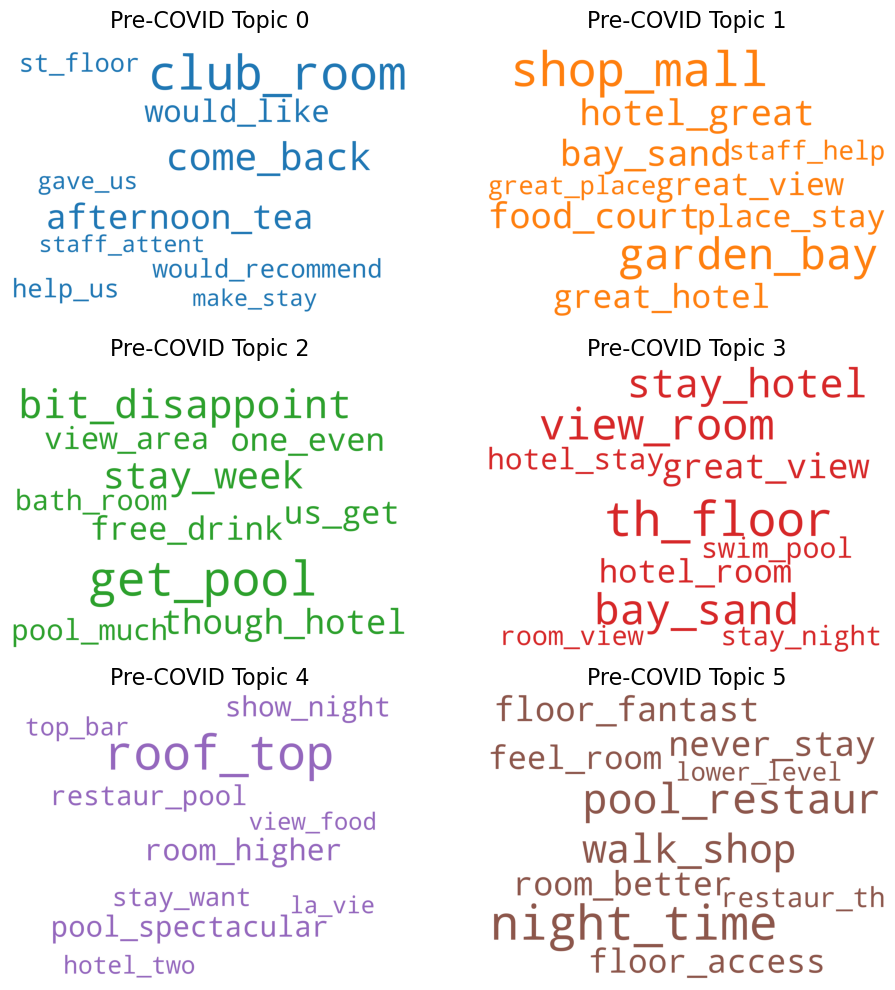

In [20]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(6):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [21]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

## Lemmatized

In [7]:
df_filtered['lem_review'] = df_filtered['lem_review'].apply(remove_stopwords)
df_filtered['lem_review'] = df_filtered['lem_review'].apply(remove_non_english_words, valid_words=english_words)
df_filtered['lem_tokens'] = df_filtered['lem_review'].apply(preprocess)

In [8]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(df_filtered['lem_tokens'])
pre_corpus = [pre_dict.doc2bow(text) for text in df_filtered['lem_tokens']]

In [24]:
## find best_coherence:
for i in range(2, 7):
    lda = gensim.models.ldamodel.LdaModel
    pre_ldamodel = lda(pre_corpus, num_topics=i, id2word=pre_dict, passes=15)
    
    precovid_coherence = CoherenceModel(model=pre_ldamodel, texts=df_filtered['lem_tokens'], dictionary=pre_dict, coherence='c_v')
    lda_coherence = precovid_coherence.get_coherence()
    print(f"The coherence score at topic {i} is {lda_coherence}")

The coherence score at topic 2 is 0.3393086211143098
The coherence score at topic 3 is 0.35634143140643476
The coherence score at topic 4 is 0.37072653573468917
The coherence score at topic 5 is 0.37408171120809947
The coherence score at topic 6 is 0.40324437306184996


In [9]:
## Use 5 topics as baseline
lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=6, id2word=pre_dict, passes=15)

In [10]:
# For All
topics_pre_lem = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in df_filtered['lem_tokens'] for word in word_list]

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_2872\3711800261.py:21: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')


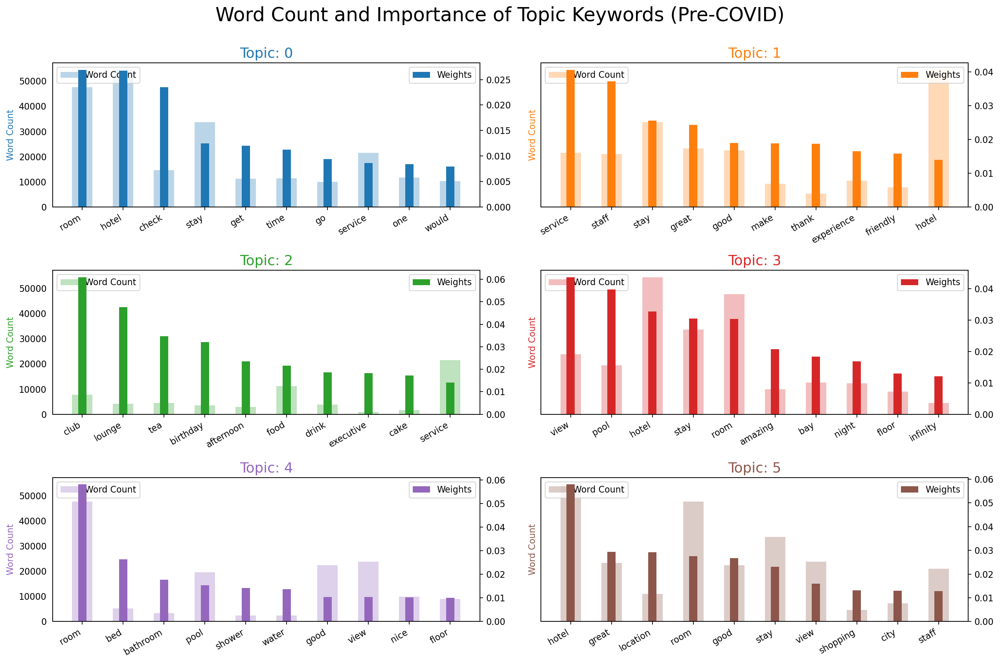

In [11]:
# Create a function to generate the plot
def plot_word_count_importance(topics, data_flat, title):
    out = []
    for i, topic in topics:
        for word, weight in topic:
            out.append([word, i, weight, data_flat.count(word)])

    df_plot = pd.DataFrame(out, columns=['word', 'topic_id', 'importance', 'word_count'])

    # Plot Word Count and Weights of Topic Keywords
    fig, axes = plt.subplots(3, 2, figsize=(16, 10), sharey=True, dpi=160)
    cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

    for i, ax in enumerate(axes.flatten()):
        ax.bar(x='word', height='word_count', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.5, alpha=0.3, label='Word Count')
        ax_twin = ax.twinx()
        ax_twin.bar(x='word', height='importance', data=df_plot.loc[df_plot.topic_id == i, :], color=cols[i], width=0.2, label='Weights')
        ax.set_ylabel('Word Count', color=cols[i])
        ax.set_title('Topic: ' + str(i), color=cols[i], fontsize=16)
        ax.tick_params(axis='y', left=False)
        ax.set_xticklabels(df_plot.loc[df_plot.topic_id == i, 'word'], rotation=30, horizontalalignment='right')
        ax.legend(loc='upper left')
        ax_twin.legend(loc='upper right')

    fig.tight_layout(w_pad=2)
    fig.suptitle(title, fontsize=22, y=1.05)
    plt.show()

# For Pre-COVID
plot_word_count_importance(topics_pre_lem, data_flat_pre, 'Word Count and Importance of Topic Keywords (Pre-COVID)')

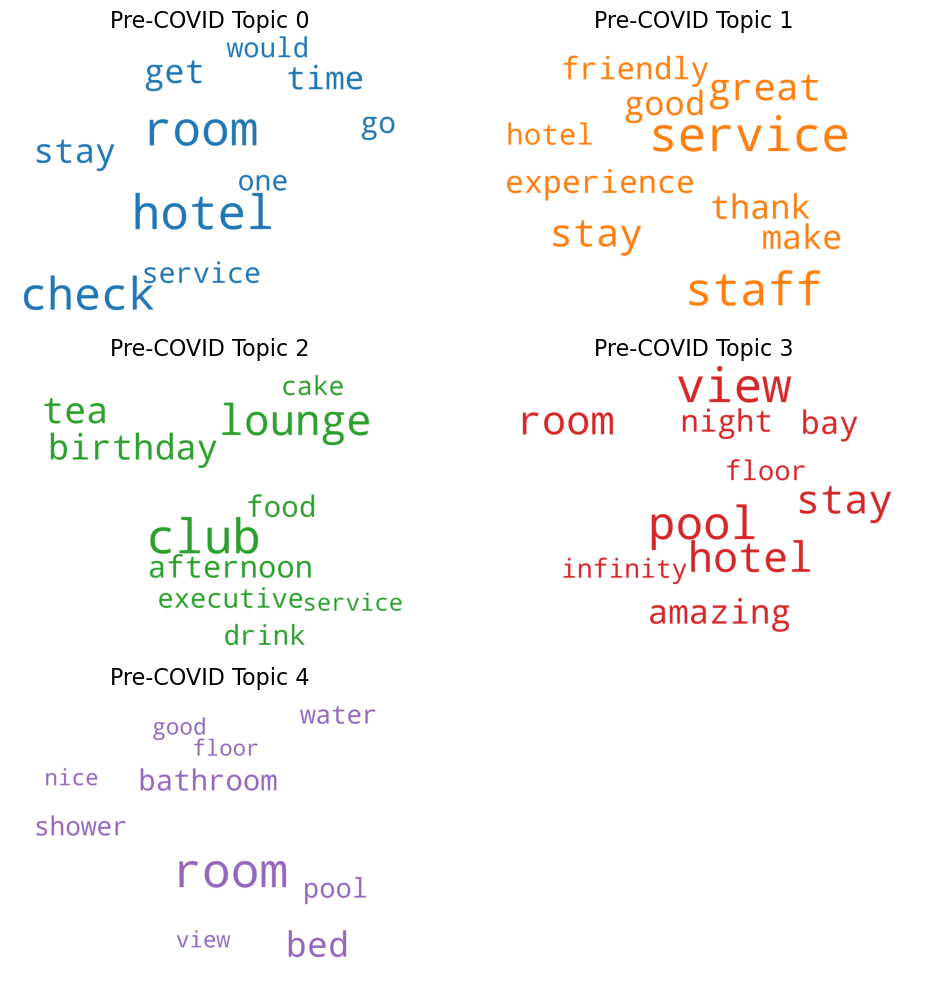

In [12]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(5):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [13]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

## Bigrams

In [14]:
clean_data = df_filtered['lem_review'].apply(preprocess)
clean_data = clean_data.apply(lambda x: ' '.join(x))

In [15]:
from nltk import ngrams
bigrams_data = []

for d in clean_data:
    tokens = word_tokenize(d)
    bigrams_data.append(["_".join(w) for w in ngrams(tokens, 2)])


In [17]:
##Generate LDA dictionary and corpus
pre_dict = corpora.Dictionary(bigrams_data)
pre_corpus = [pre_dict.doc2bow(text) for text in bigrams_data]

lda = gensim.models.ldamodel.LdaModel
pre_ldamodel = lda(pre_corpus, num_topics=6, id2word=pre_dict, passes=15)

In [18]:
# For Pre-COVID
topics_pre_lembi = pre_ldamodel.show_topics(formatted=False)
data_flat_pre = [word for word_list in bigrams_data for word in word_list]

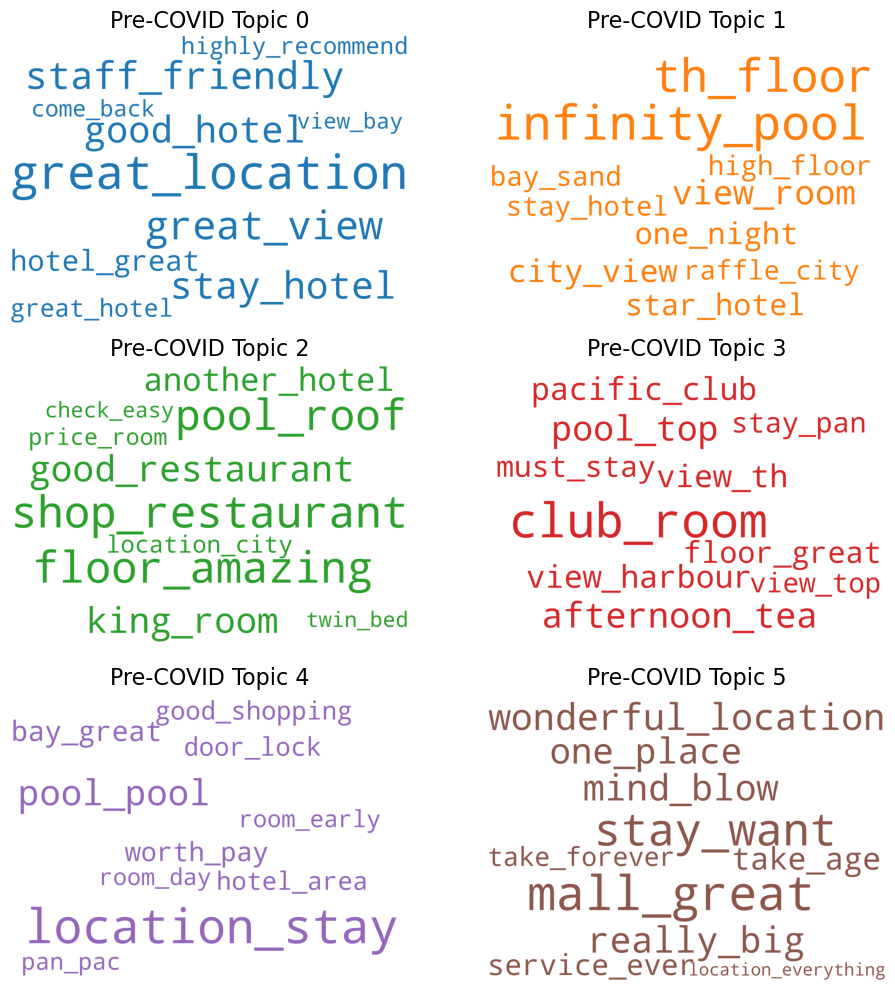

In [19]:
from wordcloud import WordCloud
import matplotlib.colors as mcolors

cols = [color for name, color in mcolors.TABLEAU_COLORS.items()]

# Create WordClouds for each topic in the pre-COVID dataset
clouds_pre = []

for i in range(6):
    cloud = WordCloud(background_color='white',
                      width=2500,
                      height=1800,
                      max_words=10,
                      colormap='tab10',
                      color_func=lambda *args, **kwargs: cols[i],
                      prefer_horizontal=1.0)
    topic_words = dict(pre_ldamodel.show_topic(i, topn=10))
    cloud.generate_from_frequencies(topic_words, max_font_size=300)
    clouds_pre.append(cloud)

# Plot the WordClouds for pre-COVID topics
fig_pre, axes_pre = plt.subplots(3, 2, figsize=(10, 10), sharex=True, sharey=True)

for i, ax in enumerate(axes_pre.flatten()):
    fig_pre.add_subplot(ax)
    if i < len(clouds_pre):
        plt.gca().imshow(clouds_pre[i])
        plt.gca().set_title('Pre-COVID Topic ' + str(i), fontdict=dict(size=16))
        plt.gca().axis('off')

plt.subplots_adjust(wspace=0, hspace=0)
plt.axis('off')
plt.margins(x=0, y=0)
plt.tight_layout()
plt.show()

In [20]:
vis = pyLDAvis.gensim.prepare(topic_model=pre_ldamodel, corpus=pre_corpus, dictionary=pre_dict)
pyLDAvis.enable_notebook()
pyLDAvis.display(vis)

## Get Topics

In [14]:
topics_pre_stem

[(0,
  [('us', 0.044818092),
   ('thank', 0.040604565),
   ('staff', 0.04011219),
   ('birthday', 0.024082802),
   ('help', 0.021959232),
   ('special', 0.020300448),
   ('make', 0.017506974),
   ('team', 0.017374806),
   ('made', 0.0170404),
   ('great', 0.015116557),
   ('back', 0.012308488),
   ('like', 0.012300882),
   ('wonder', 0.01141464),
   ('wed', 0.011199881),
   ('feel', 0.011168169),
   ('cake', 0.010979845),
   ('excel', 0.010755815),
   ('attent', 0.0102314735),
   ('alway', 0.010202961),
   ('guest', 0.00934842)]),
 (1,
  [('stay', 0.06384458),
   ('hotel', 0.04503496),
   ('room', 0.043763496),
   ('view', 0.04314644),
   ('club', 0.027513117),
   ('night', 0.022924194),
   ('best', 0.017501643),
   ('staff', 0.017040145),
   ('great', 0.016850576),
   ('bay', 0.016842607),
   ('floor', 0.016264493),
   ('love', 0.013947358),
   ('pool', 0.013542437),
   ('one', 0.013401498),
   ('time', 0.013345013),
   ('th', 0.011875195),
   ('visit', 0.011367126),
   ('fantast', 0.

In [15]:
top_dict = {}
for i in topics_pre_stem:
    top_dict[i[0]] = []
    for j in i[1]:
        print(j)
        top_dict[i[0]].append(j[0])

('us', 0.044818092)
('thank', 0.040604565)
('staff', 0.04011219)
('birthday', 0.024082802)
('help', 0.021959232)
('special', 0.020300448)
('make', 0.017506974)
('team', 0.017374806)
('made', 0.0170404)
('great', 0.015116557)
('back', 0.012308488)
('like', 0.012300882)
('wonder', 0.01141464)
('wed', 0.011199881)
('feel', 0.011168169)
('cake', 0.010979845)
('excel', 0.010755815)
('attent', 0.0102314735)
('alway', 0.010202961)
('guest', 0.00934842)
('stay', 0.06384458)
('hotel', 0.04503496)
('room', 0.043763496)
('view', 0.04314644)
('club', 0.027513117)
('night', 0.022924194)
('best', 0.017501643)
('staff', 0.017040145)
('great', 0.016850576)
('bay', 0.016842607)
('floor', 0.016264493)
('love', 0.013947358)
('pool', 0.013542437)
('one', 0.013401498)
('time', 0.013345013)
('th', 0.011875195)
('visit', 0.011367126)
('fantast', 0.011357928)
('would', 0.010968361)
('day', 0.01066302)
('food', 0.06710666)
('good', 0.038157437)
('tea', 0.037997924)
('casino', 0.03090687)
('great', 0.030240737)

In [16]:
top_dict

{0: ['us',
  'thank',
  'staff',
  'birthday',
  'help',
  'special',
  'make',
  'team',
  'made',
  'great',
  'back',
  'like',
  'wonder',
  'wed',
  'feel',
  'cake',
  'excel',
  'attent',
  'alway',
  'guest'],
 1: ['stay',
  'hotel',
  'room',
  'view',
  'club',
  'night',
  'best',
  'staff',
  'great',
  'bay',
  'floor',
  'love',
  'pool',
  'one',
  'time',
  'th',
  'visit',
  'fantast',
  'would',
  'day'],
 2: ['food',
  'good',
  'tea',
  'casino',
  'great',
  'afternoon',
  'restaur',
  'dinner',
  'buffet',
  'drink',
  'nice',
  'enjoy',
  'recommend',
  'high',
  'select',
  'love',
  'lunch',
  'place',
  'also',
  'excel'],
 3: ['pool',
  'view',
  'hotel',
  'room',
  'bay',
  'floor',
  'garden',
  'night',
  'one',
  'get',
  'sand',
  'area',
  'like',
  'top',
  'go',
  'swim',
  'place',
  'shop',
  'nice',
  'also'],
 4: ['room',
  'check',
  'hotel',
  'stay',
  'time',
  'us',
  'book',
  'staff',
  'would',
  'one',
  'get',
  'day',
  'wait',
  'even

In [17]:
df_res = pd.DataFrame(top_dict)
df_res

,0,1,2,3,4,5
0,us,stay,food,pool,room,hotel
1,thank,hotel,good,view,check,great
2,staff,room,tea,hotel,hotel,room
3,birthday,view,casino,room,stay,stay
4,help,club,great,bay,time,good
5,special,night,afternoon,floor,us,staff
6,make,best,restaur,garden,book,breakfast
7,team,staff,dinner,night,staff,shop
8,made,great,buffet,one,would,view
9,great,bay,drink,get,one,excel


In [18]:
df_res.to_csv('5-star LDA.csv')

## DP

In [19]:
import spacy
nlp = spacy.load("en_core_web_sm")

In [20]:
# Pass in LDA topics output to remove overlap words by choosing highest prob
def restruct_topics(topics): 
    word_prob_dict = {}
    for i in range(len(topics)):
        topic_num = topics[i][0]
        for word, prob in topics[i][1]:
            if word in word_prob_dict:
                word_prob_dict[word].append((topic_num, prob))
            else:
                ls = [(topic_num, prob)]
                word_prob_dict[word] = ls
    new_dict = {}
    for word in word_prob_dict:
        topic, highest_prob = max(word_prob_dict[word], key = lambda x: x[1])
        if topic in new_dict:
            new_dict[topic].append(word)
        else:
            ls = [word]
            new_dict[topic] = ls
    return new_dict

In [21]:
new_dict = restruct_topics(topics_pre_stem)

In [22]:
new_dict = restruct_topics(topics_pre_stem)
for x in new_dict:
    print(f'length topic {x}: {len(new_dict[x])}')

length topic 1: 11
length topic 0: 11
length topic 5: 12
length topic 4: 10
length topic 2: 16
length topic 3: 17


In [23]:
#takes in the dataframe and appends to each row (aspect, review) pair(s)
def dep_parse(data, new_dict):
    data['aspect_sentiment'] = np.empty((len(data), 0)).tolist()
    for i in range(len(data)):
        sentence = data['combined_review'][i]
        doc = nlp(sentence)
        aspect_sentiment = []
        for word in doc:
            cond = False
            for x in new_dict.values():
                if word.text in x:
                    cond = True
                    break
            if not cond:
                continue
            if word.pos_ == 'NOUN': 
                for j in word.lefts:
                    #print(j, word, j.dep_, j.pos_)
                    if j.dep_ == 'amod' and j.pos_ == 'ADJ':
                        tup = [word, j, list(new_dict.values()).index(x)]
                        #print(tup)
                        aspect_sentiment.append(tup)
                    for k in j.lefts:
                        if k.dep_ == 'advmod':
                            #print(word, j ,k)
                            tup = (word, k.text + ' ' + j.text)
                            aspect_sentiment.append(tup)
                            if (word, j) in aspect_sentiment:
                                aspect_sentiment.remove([word, j, list(new_dict.values()).index(x)])
        data['aspect_sentiment'][i] = aspect_sentiment

In [24]:
df_filtered = df_filtered.reset_index()

In [ ]:
dep_parse(df_filtered, new_dict)

C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9440\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9440\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['aspect_sentiment'][i] = aspect_sentiment
C:\Users\Chen Wei\AppData\Local\Temp\ipykernel_9440\1416447991.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

In [ ]:
df_filtered['aspect_sentiment']

## Import PyABSA

In [18]:
df_test = pd.read_json('../pyABSA_outputs/Aspect_Term_Extraction_and_Polarity_Classification_FAST_LCF_ATEPC.json')

In [19]:
df_test

,sentence,IOB,tokens,aspect,position,sentiment,probs,confidence
0,clean comfort hotel room find decent hotel tra...,"[O, B-ASP, O, O, O, O, O, O, O, B-ASP, O, O, O...","[clean, comfort, hotel, room, find, decent, ho...","[comfort, food, glass, closet space, port]","[[1], [9], [30], [37, 38], [47]]","[Positive, Negative, Negative, Negative, Negat...","[[0.022732432931661002, 0.002103362465277, 0.9...","[0.9752000000000001, 0.922, 0.8991, 0.86620000..."
1,good hotel great great place great room small ...,"[O, O, O, O, B-ASP, O, O, O, O, O, O, O, O, O,...","[good, hotel, great, great, place, great, room...",[place],[[4]],[Positive],"[[0.0005702517228200001, 0.0003066391509490000...",[0.9991000000000001]
2,good place decent price good place good price ...,"[O, O, O, B-ASP, O, O, O, O, O, O, O, O, B-ASP...","[good, place, decent, price, good, place, good...","[price, food]","[[3], [12]]","[Positive, Negative]","[[0.005487654823809001, 0.013030127622187, 0.9...","[0.9815, 0.912]"
3,great great staff neat hotel line star rate st...,"[O, O, B-ASP, O, O, O, O, O, O, B-ASP, I-ASP, ...","[great, great, staff, neat, hotel, line, star,...","[staff, front desk]","[[2], [9, 10]]","[Positive, Positive]","[[0.032106801867485005, 0.00041079759830600003...","[0.9675, 0.9994000000000001]"
4,good budget stay stay day nice seven eleven ne...,"[O, O, O, O, O, O, O, O, O, O, O, O, O, O, O, ...","[good, budget, stay, stay, day, nice, seven, e...",[wait],[[18]],[Positive],"[[0.408927053213119, 0.019343916326761003, 0.5...",[0.5717]
...,...,...,...,...,...,...,...,...
68287,swiss hotel swiss stay hotel mani time recent ...,"[O, O, O, O, O, O, O, O, O, O, O, O, O, O, O, ...","[swiss, hotel, swiss, stay, hotel, mani, time,...","[size, staff, porter, crew]","[[15], [35], [67], [78]]","[Negative, Negative, Negative, Negative]","[[0.998076200485229, 0.001359648769721, 0.0005...","[0.9981000000000001, 0.9958, 0.9956, 0.9973000..."
68288,stay stay night wife ideal view th floor floor...,"[O, O, O, O, O, B-ASP, O, O, O, O, O, O, O, O,...","[stay, stay, night, wife, ideal, view, th, flo...","[view, staff, air]","[[5], [25], [45]]","[Positive, Positive, Positive]","[[0.09106669574975901, 0.0005153458332640001, ...","[0.9084000000000001, 0.8150000000000001, 0.9484]"
68289,great view great decent room one night hotel v...,"[O, B-ASP, O, O, B-ASP, O, O, O, O, O, O, O, O...","[great, view, great, decent, room, one, night,...","[view, room, bathroom]","[[1], [4], [23]]","[Positive, Positive, Positive]","[[0.000963231665082, 0.000514330400619, 0.9985...","[0.9985, 0.9973000000000001, 0.9973000000000001]"
68290,hotel date old four night mani cup machin shop...,"[O, O, O, O, O, O, O, O, O, O, O, O, O, B-ASP,...","[hotel, date, old, four, night, mani, cup, mac...","[bed, cover]","[[13], [18]]","[Positive, Positive]","[[0.07999674975872001, 0.000742122647352, 0.91...","[0.9193, 0.6769000000000001]"


In [20]:
df_json = df_test[df_test['sentence'].isin(list(df_filtered['stem_review']))]

In [21]:
len(df_json) == len(df_filtered) ##check if the number of elements is the same

True

In [22]:
df_json = df_json[['sentence', 'tokens', 'aspect', 'sentiment', 'confidence']]

In [23]:
df_json

,sentence,tokens,aspect,sentiment,confidence
32670,man pool kind thought time went pool want exac...,"[man, pool, kind, thought, time, went, pool, w...",[pool],[Negative],[0.8258000000000001]
32671,best hotel rate one best hotel stay around wor...,"[best, hotel, rate, one, best, hotel, stay, ar...","[room, staff]","[Negative, Negative]","[0.998, 0.9956]"
32672,team hotel perfect nice yet comfort stay ideal...,"[team, hotel, perfect, nice, yet, comfort, sta...",[comfort],[Positive],[0.9785]
32673,perfect husband frequent travel stay bay sand ...,"[perfect, husband, frequent, travel, stay, bay...","[look, comfort place, staff]","[Positive, Negative, Negative]","[0.9711000000000001, 0.5018, 0.5366000000000001]"
32674,warm hotel trip got flu hotel staff met strait...,"[warm, hotel, trip, got, flu, hotel, staff, me...",[staff],[Negative],[0.9908]
...,...,...,...,...,...
68287,swiss hotel swiss stay hotel mani time recent ...,"[swiss, hotel, swiss, stay, hotel, mani, time,...","[size, staff, porter, crew]","[Negative, Negative, Negative, Negative]","[0.9981000000000001, 0.9958, 0.9956, 0.9973000..."
68288,stay stay night wife ideal view th floor floor...,"[stay, stay, night, wife, ideal, view, th, flo...","[view, staff, air]","[Positive, Positive, Positive]","[0.9084000000000001, 0.8150000000000001, 0.9484]"
68289,great view great decent room one night hotel v...,"[great, view, great, decent, room, one, night,...","[view, room, bathroom]","[Positive, Positive, Positive]","[0.9985, 0.9973000000000001, 0.9973000000000001]"
68290,hotel date old four night mani cup machin shop...,"[hotel, date, old, four, night, mani, cup, mac...","[bed, cover]","[Positive, Positive]","[0.9193, 0.6769000000000001]"


## Get PyABSA topics

In [24]:
def get_topics(lst, dictionary, sentiment, confidence, topics_list, vectorizer, transformer, model):
    ans = []
    for word in range(len(lst)):
        docbow = dictionary.doc2bow([lst[word]])
        if len(docbow) == 0:
            tpc = get_cosine_similarity(lst[word], topics_list, vectorizer, transformer)
            res = (tpc, sentiment[word], confidence[word])
        else:
            tpc = model.get_document_topics(docbow)
            new_tpc = []
            max_val = 0
            max_tpc = -1
            for c, v in tpc:
                if v > max_val:
                    max_val = v
                    max_tpc = c
            res = (max_tpc, sentiment[word], confidence[word])
        ans.append(res)
    return ans

In [25]:
def get_cosine_similarity(word, topics_list, vectorizer, transformer):
    aspect_vec = vectorizer.transform([word])
    aspect_trf = transformer.transform(aspect_vec)
    cos_res = {}
    for i in range(len(topics_list.columns)):
        topic_words_vec = vectorizer.transform(list(topics_list[i]))
        topic_words_trf = transformer.transform(topic_words_vec)
        r = cosine_similarity(aspect_trf, topic_words_trf)
        cos_sim = np.rad2deg(np.arccos(r))
        
        mid_res = []
        for j in cos_sim:
            min_cos_sim = min(j)
            mid_res.append(min_cos_sim)
        cos_res[i] = mid_res
    min_val = 90
    min_topic = -1
    for k, v in cos_res.items():
        if v[0] < min_val:
            min_val = v
            min_topic = k
    return k

In [26]:
from sklearn.feature_extraction.text import CountVectorizer,TfidfTransformer
import scipy.sparse

In [27]:
df_filtered['vec_tokens'] = df_filtered['stem_tokens'].apply(lambda x: ' '.join(x))

In [28]:
vectorizer = CountVectorizer()
transformer = TfidfTransformer()

filtered_vec = vectorizer.fit_transform(df_filtered['vec_tokens'])
filtered_trf = transformer.fit_transform(filtered_vec)

In [29]:
df_json['topics'] = np.empty((len(df_json), 0)).tolist()

In [30]:
df_json

,sentence,tokens,aspect,sentiment,confidence,topics
32670,man pool kind thought time went pool want exac...,"[man, pool, kind, thought, time, went, pool, w...",[pool],[Negative],[0.8258000000000001],[]
32671,best hotel rate one best hotel stay around wor...,"[best, hotel, rate, one, best, hotel, stay, ar...","[room, staff]","[Negative, Negative]","[0.998, 0.9956]",[]
32672,team hotel perfect nice yet comfort stay ideal...,"[team, hotel, perfect, nice, yet, comfort, sta...",[comfort],[Positive],[0.9785],[]
32673,perfect husband frequent travel stay bay sand ...,"[perfect, husband, frequent, travel, stay, bay...","[look, comfort place, staff]","[Positive, Negative, Negative]","[0.9711000000000001, 0.5018, 0.5366000000000001]",[]
32674,warm hotel trip got flu hotel staff met strait...,"[warm, hotel, trip, got, flu, hotel, staff, me...",[staff],[Negative],[0.9908],[]
...,...,...,...,...,...,...
68287,swiss hotel swiss stay hotel mani time recent ...,"[swiss, hotel, swiss, stay, hotel, mani, time,...","[size, staff, porter, crew]","[Negative, Negative, Negative, Negative]","[0.9981000000000001, 0.9958, 0.9956, 0.9973000...",[]
68288,stay stay night wife ideal view th floor floor...,"[stay, stay, night, wife, ideal, view, th, flo...","[view, staff, air]","[Positive, Positive, Positive]","[0.9084000000000001, 0.8150000000000001, 0.9484]",[]
68289,great view great decent room one night hotel v...,"[great, view, great, decent, room, one, night,...","[view, room, bathroom]","[Positive, Positive, Positive]","[0.9985, 0.9973000000000001, 0.9973000000000001]",[]
68290,hotel date old four night mani cup machin shop...,"[hotel, date, old, four, night, mani, cup, mac...","[bed, cover]","[Positive, Positive]","[0.9193, 0.6769000000000001]",[]


In [31]:
for i, r in df_json.iterrows():
    asp = r['aspect']
    sent = r['sentiment']
    confid = r['confidence']
    tpc = get_topics(asp, pre_dict, sent, confid, df_res, vectorizer, transformer, ldamodel)
    tpcs = r['topics']
    for i in tpc:
        tpcs.append(i)
    r['topics'] = tpcs

In [32]:
print(f"The number of reviews without any topics is {sum(df_json['topics'].apply(lambda x: len(x) == 0))}")
print(f"The number of reviews with exactly one topic is {sum(df_json['topics'].apply(lambda x: len(x) == 1))}")
print(f"The number of reviews with more than one topic is {sum(df_json['topics'].apply(lambda x: len(x) > 1))}")

The number of reviews without any topics is 1658
The number of reviews with exactly one topic is 9019
The number of reviews with more than one topic is 24945


In [33]:
df_json

,sentence,tokens,aspect,sentiment,confidence,topics
32670,man pool kind thought time went pool want exac...,"[man, pool, kind, thought, time, went, pool, w...",[pool],[Negative],[0.8258000000000001],"[(3, Negative, 0.8258000000000001)]"
32671,best hotel rate one best hotel stay around wor...,"[best, hotel, rate, one, best, hotel, stay, ar...","[room, staff]","[Negative, Negative]","[0.998, 0.9956]","[(4, Negative, 0.998), (0, Negative, 0.9956)]"
32672,team hotel perfect nice yet comfort stay ideal...,"[team, hotel, perfect, nice, yet, comfort, sta...",[comfort],[Positive],[0.9785],"[(5, Positive, 0.9785)]"
32673,perfect husband frequent travel stay bay sand ...,"[perfect, husband, frequent, travel, stay, bay...","[look, comfort place, staff]","[Positive, Negative, Negative]","[0.9711000000000001, 0.5018, 0.5366000000000001]","[(3, Positive, 0.9711000000000001), (5, Negati..."
32674,warm hotel trip got flu hotel staff met strait...,"[warm, hotel, trip, got, flu, hotel, staff, me...",[staff],[Negative],[0.9908],"[(0, Negative, 0.9908)]"
...,...,...,...,...,...,...
68287,swiss hotel swiss stay hotel mani time recent ...,"[swiss, hotel, swiss, stay, hotel, mani, time,...","[size, staff, porter, crew]","[Negative, Negative, Negative, Negative]","[0.9981000000000001, 0.9958, 0.9956, 0.9973000...","[(3, Negative, 0.9981000000000001), (0, Negati..."
68288,stay stay night wife ideal view th floor floor...,"[stay, stay, night, wife, ideal, view, th, flo...","[view, staff, air]","[Positive, Positive, Positive]","[0.9084000000000001, 0.8150000000000001, 0.9484]","[(1, Positive, 0.9084000000000001), (0, Positi..."
68289,great view great decent room one night hotel v...,"[great, view, great, decent, room, one, night,...","[view, room, bathroom]","[Positive, Positive, Positive]","[0.9985, 0.9973000000000001, 0.9973000000000001]","[(1, Positive, 0.9985), (4, Positive, 0.997300..."
68290,hotel date old four night mani cup machin shop...,"[hotel, date, old, four, night, mani, cup, mac...","[bed, cover]","[Positive, Positive]","[0.9193, 0.6769000000000001]","[(4, Positive, 0.9193), (4, Positive, 0.676900..."


In [34]:
df_json.to_csv('5star_pyABSA_updated.csv')